<a href="https://colab.research.google.com/github/guebin/DL2024/blob/main/posts/07wk-1-2.ipynb"><img src="https://colab.research.google.com/assets/colab-badge.svg" style="text-align: left"></a>

# 1. 강의영상 

In [1]:
#{{<video https://youtu.be/playlist?list=PLQqh36zP38-wTzMRmZzvr2TL12DNo6jXF&si=RnG6_-uhn9Yb57nU >}}

# 2. Imports

In [2]:
import torch 
import torchvision
import fastai.vision.all
import matplotlib.pyplot as plt
import requests

# 3. XAI란?

<https://brunch.co.kr/@hvnpoet/140>

# 4. CAM의 구현을 위한 예비학습

## A. DLS

In [17]:
path = fastai.data.external.untar_data(fastai.data.external.URLs.PETS)
#path.ls()
(path/'images').ls()

(#7393) [Path('/root/.fastai/data/oxford-iiit-pet/images/Sphynx_14.jpg'),Path('/root/.fastai/data/oxford-iiit-pet/images/american_bulldog_224.jpg'),Path('/root/.fastai/data/oxford-iiit-pet/images/chihuahua_133.jpg'),Path('/root/.fastai/data/oxford-iiit-pet/images/Bombay_122.jpg'),Path('/root/.fastai/data/oxford-iiit-pet/images/english_setter_153.jpg'),Path('/root/.fastai/data/oxford-iiit-pet/images/Ragdoll_188.jpg'),Path('/root/.fastai/data/oxford-iiit-pet/images/newfoundland_125.jpg'),Path('/root/.fastai/data/oxford-iiit-pet/images/Bombay_156.jpg'),Path('/root/.fastai/data/oxford-iiit-pet/images/keeshond_122.jpg'),Path('/root/.fastai/data/oxford-iiit-pet/images/Birman_115.jpg')...]

In [21]:
(path/'images').ls()[214],(path/'images').ls()[448],(path/'images').ls()[2976]

(Path('/root/.fastai/data/oxford-iiit-pet/images/Abyssinian_101.mat'),
 Path('/root/.fastai/data/oxford-iiit-pet/images/Abyssinian_100.mat'),
 Path('/root/.fastai/data/oxford-iiit-pet/images/Abyssinian_102.mat'))

In [37]:
fnames = fastai.data.transforms.get_image_files(path/'images')
#fnames = [l for l in (path/'images').ls() if str(l).split('.')[-1] == 'jpg']

In [32]:
def label_func(fname):
    if fname[0].isupper():
        return 'cat'
    else:
        return 'dog'

In [38]:
dls = fastai.vision.data.ImageDataLoaders.from_name_func(
    path = path/'images',
    fnames = fnames,
    label_func = label_func,
    item_tfms = fastai.vision.augment.Resize(512),
    bs = 32 # batch_size = 32 
)

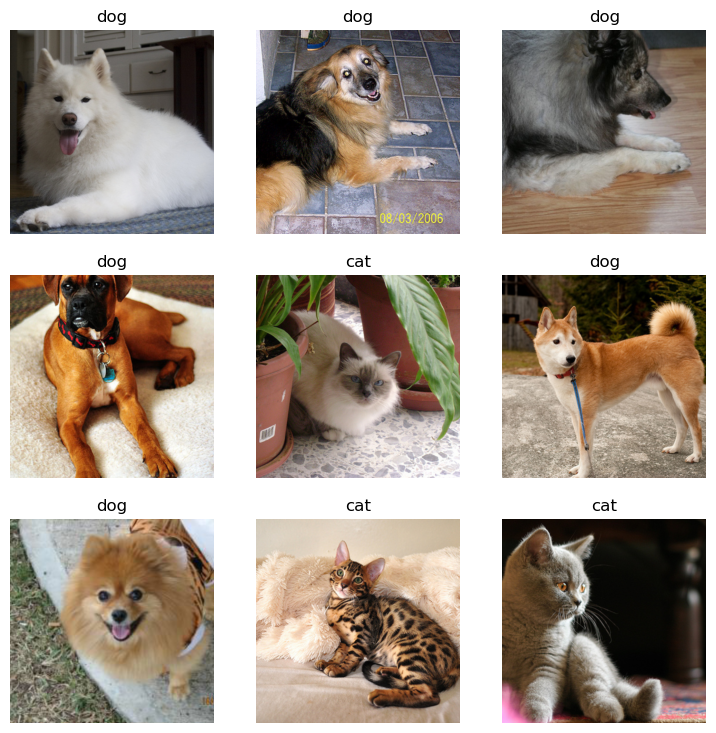

In [39]:
dls.show_batch()

## B. 이미지 자료 불러오기

`-` 원래 우리가 아는 방법: path를 의미하는 string $\to$ torch.tensor 

In [60]:
x = torchvision.io.read_image('/root/.fastai/data/oxford-iiit-pet/images/Sphynx_14.jpg')
print(f"type: {type(x)}")
print(f"shape: {x.shape}")
print(f"dtype: {x.dtype}")

type: <class 'torch.Tensor'>
shape: torch.Size([3, 333, 500])
dtype: torch.uint8


`-` fastai를 이용하는 방법: path를 의미하는 string $\to$ PILImage $\to$ fastai.torch_core.TensorImage $\to$ torch.tensor

In [66]:
x_pil = fastai.vision.core.PILImage.create('/root/.fastai/data/oxford-iiit-pet/images/Sphynx_14.jpg')
x = next(iter(dls.test_dl([x_pil])))[0]
print(f"type: {type(x)}")
print(f"shape: {x.shape}")
print(f"dtype: {x.dtype}")
# print('---')
# x = torch.tensor(x)
# print(f"type: {type(x)}")
# print(f"shape: {x.shape}")
# print(f"dtype: {x.dtype}")

type: <class 'fastai.torch_core.TensorImage'>
shape: torch.Size([1, 3, 512, 512])
dtype: torch.float32


In [72]:
x_pil = fastai.vision.core.PILImage.create(requests.get('https://github.com/guebin/DL2024/blob/main/imgs/01wk-hani1.jpeg?raw=true').content)
x = next(iter(dls.test_dl([x_pil])))[0]
print(f"type: {type(x)}")
print(f"shape: {x.shape}")
print(f"dtype: {x.dtype}")

type: <class 'fastai.torch_core.TensorImage'>
shape: torch.Size([1, 3, 512, 512])
dtype: torch.float32


`-` 참고로 아래와 같이 이미지변환할 수도 있음. 

In [76]:
x_pil = fastai.vision.core.PILImage.create('/root/.fastai/data/oxford-iiit-pet/images/Sphynx_14.jpg')
#x = next(iter(dls.test_dl([x_pil])))[0]
x = fastai.torch_core.TensorImage(x_pil)
print(f"type: {type(x)}")
print(f"shape: {x.shape}")
print(f"dtype: {x.dtype}")

type: <class 'fastai.torch_core.TensorImage'>
shape: torch.Size([333, 500, 3])
dtype: torch.uint8


## C. 이미지 자료 시각화 

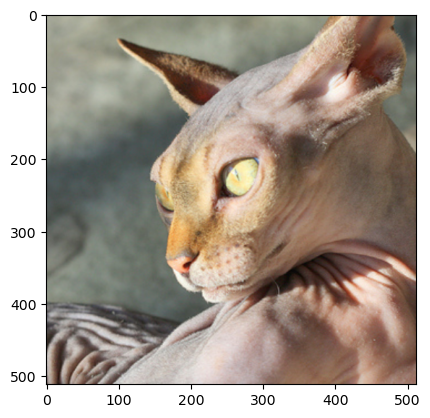

In [253]:
x_pil = fastai.vision.core.PILImage.create('/root/.fastai/data/oxford-iiit-pet/images/Sphynx_14.jpg')
x = next(iter(dls.test_dl([x_pil])))[0] # lrnr를 학습이후에는 여기에 저장되는 x값이 조금 달라지게됨
x_dec = dls.decode([x])
plt.imshow(torch.einsum('ocij -> ijc', x_dec))

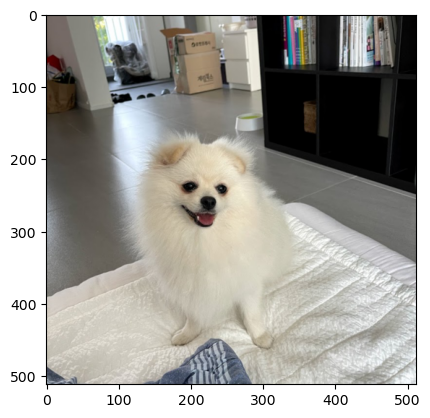

In [255]:
x_pil = fastai.vision.core.PILImage.create(requests.get('https://github.com/guebin/DL2024/blob/main/imgs/01wk-hani1.jpeg?raw=true').content)
x = next(iter(dls.test_dl([x_pil])))[0] # lrnr를 학습이후에는 여기에 저장되는 x값이 조금 달라지게됨
x_dec = dls.decode([x])
plt.imshow(torch.einsum('ocij -> ijc', x_dec))

## D. AP layer 

In [87]:
ap = torch.nn.AdaptiveAvgPool2d(output_size=1)
ap

AdaptiveAvgPool2d(output_size=1)

In [91]:
X = torch.arange(1*3*4*4).reshape(1,3,4,4)*1.0 
X

tensor([[[[ 0.,  1.,  2.,  3.],
          [ 4.,  5.,  6.,  7.],
          [ 8.,  9., 10., 11.],
          [12., 13., 14., 15.]],

         [[16., 17., 18., 19.],
          [20., 21., 22., 23.],
          [24., 25., 26., 27.],
          [28., 29., 30., 31.]],

         [[32., 33., 34., 35.],
          [36., 37., 38., 39.],
          [40., 41., 42., 43.],
          [44., 45., 46., 47.]]]])

In [100]:
ap(X) # 채널별로 평균을 구해줌. 

tensor([[[[ 7.5000]],

         [[23.5000]],

         [[39.5000]]]])

In [107]:
r,g,b = X[0]

In [111]:
r.mean(), g.mean(), b.mean()

(tensor(7.5000), tensor(23.5000), tensor(39.5000))

In [112]:
ap(r), ap(g), ap(b) 

(tensor([[7.5000]]), tensor([[23.5000]]), tensor([[39.5000]]))

## E. AP, Linear의 교환

`-` 신기한 거 보여줄까요??

In [116]:
ap(r)*0.1 + ap(g)*0.2 + ap(b)*0.3

tensor([[17.3000]])

In [115]:
ap(r*0.1 + g*0.2 + b*0.3)

tensor([[17.3000]])

- 별로 안 신기함.. 당연한것 아니야? 

`-` `torch.nn.Linear()` 와 `torch.nn.Flatten()` 를 이용한 구현 

In [138]:
flatten = torch.nn.Flatten()
l = torch.nn.Linear(3,1,bias=False)

In [139]:
# ap(r)*0.1 + ap(g)*0.2 + ap(b)*0.3
l.weight.data = torch.tensor([[0.1, 0.2, 0.3]])
l(flatten(ap(X)))

tensor([[17.3000]], grad_fn=<MmBackward0>)

In [154]:
#ap(r*0.1 + g*0.2 + b*0.3) ## 각각의 픽셀에 l을 취하고 그 결과에 ap를 취해야함 
flatten(ap(torch.einsum('ocij,kc -> okij',X,l.weight.data)))

tensor([[17.3000]])

`-` 정리

In [164]:
# 계산1: x를 ap, flatten, linear 순서로 적용
print(f"{X.shape} -- X")
print(f"{ap(X).shape} -- ap(X)")
print(f"{flatten(ap(X)).shape} -- flatten(ap(X))")
print(f"{l(flatten(ap(X))).shape} -- l(flatten(ap(X)))")

torch.Size([1, 3, 4, 4]) -- X
torch.Size([1, 3, 1, 1]) -- ap(X)
torch.Size([1, 3]) -- flatten(ap(X))
torch.Size([1, 1]) -- l(flatten(ap(X)))


In [168]:
# 계산2: x를 linear, ap, flatten 순서로 적용
print(f"{X.shape} -- X")
print(f"{torch.einsum('ocij,kc -> okij',X,l.weight.data).shape} -- l(X)")
print(f"{ap(torch.einsum('ocij,kc -> okij',X,l.weight.data)).shape} -- ap(l(X))")
print(f"{flatten(ap(torch.einsum('ocij,kc -> okij',X,l.weight.data))).shape} -- flatten(ap(l(X)))")

torch.Size([1, 3, 4, 4]) -- X
torch.Size([1, 1, 4, 4]) -- l(X)
torch.Size([1, 1, 1, 1]) -- ap(l(X))
torch.Size([1, 1]) -- flatten(ap(l(X)))


$$\underset{(n,3,4,4)}{\boldsymbol X} \overset{ap}{\to} \underset{(n,3,1,1)}{{\boldsymbol \sharp}}\overset{flatten}{\to} \underset{(n,3)}{{\boldsymbol \sharp}}\overset{linear}{\to} \underset{(n,1)}{\hat{\boldsymbol y}} = [[17.3],...]$$

$$\underset{(n,3,4,4)}{\boldsymbol X} \overset{linear}{\to} \underset{(n,1,4,4)}{{\boldsymbol \sharp}}\overset{ap}{\to} \underset{(n,1,1,1)}{{\boldsymbol \sharp}}\overset{flatten}{\to} \underset{(n,1)}{\hat{\boldsymbol y}} = [[17.3],...]$$

# 5. CAM[@zhou2016learning]의 구현

ref: <https://arxiv.org/abs/1512.04150>

`-` 이 강의노트는 위의 논문의 내용을 재구성하였음. 

- 논문의 수식을 이해해서 코드로 재구성하는 능력이 새로운 방법을 빠르게 습득할 수 있도록 해줌.
- 학기 끝나고 "논문->코드"로 만드는 과정을 연습하면 대학원등에서 공부할때 도움이 될 것 같음. 

## A. 1단계 -- 이미지분류 잘하는 네트워크 선택 후 학습

In [171]:
lrnr = fastai.vision.learner.vision_learner(
    dls = dls,
    arch = fastai.vision.models.resnet34, 
    metrics = [fastai.metrics.accuracy]
)    

In [173]:
lrnr.fine_tune(1)

epoch,train_loss,valid_loss,accuracy,time
0,0.101094,0.035343,0.989851,00:20


epoch,train_loss,valid_loss,accuracy,time
0,0.068278,0.004763,0.997970,00:26


## B. 2단계-- 네트워크의 끝 부분 수정하고 재학습

`-` 일반적으로 CNN계열은 2D-part와 1D-part로 구분되어있음.


In [187]:
net1 = lrnr.model[0] # 2d-part 
net2 = lrnr.model[1] # 1d-part 

In [186]:
# 하나의 배치를 테스트용으로 임시로 가져옴
_X, _y = dls.one_batch()
_X.shape,_y.shape 

(torch.Size([32, 3, 512, 512]), torch.Size([32]))

In [213]:
print(f"입력이미지:\t\t {_X.shape}")
print(f"net1통과직후:\t\t {net1(_X).shape}")
print(f"net2의AP까지통과직후:\t {net2[0](net1(_X)).shape}")
print(f"net2의Flatten까지통과직후:\t {net2[1](net2[0](net1(_X))).shape}")
print(f"net2끝까지통과:\t\t {net2(net1(_X)).shape}")

입력이미지:		 torch.Size([32, 3, 512, 512])
net1통과직후:		 torch.Size([32, 512, 16, 16])
net2의AP까지통과직후:	 torch.Size([32, 1024, 1, 1])
net2의Flatten까지통과직후:	 torch.Size([32, 1024])
net2끝까지통과:		 torch.Size([32, 2])


`-` net2를 아래와 같이 수정하자. (왜??)

In [215]:
net2 = torch.nn.Sequential(
    torch.nn.AdaptiveAvgPool2d(output_size=1), # [n, 512, 16, 16] --> [n, 512, 1, 1]
    torch.nn.Flatten(), # [n, 512, 1, 1] -->  [n, 512]
    torch.nn.Linear(512,2,bias=False) # [n,512] --> [n,2] 
)

In [218]:
net = torch.nn.Sequential(
    net1, # 원래 resnet34에 있던거..
    net2 # 내가 (CAM을 위해서) 마음대로 바꾼것.. 
)

In [222]:
lrnr2 = fastai.learner.Learner(
    dls = dls, 
    model = net,
    metrics = [fastai.metrics.accuracy] 
)    

In [228]:
lrnr.loss_func, lrnr2.loss_func # loss_fn 은 따로 정의안했는데 알아서 잘 들어가 있음

(FlattenedLoss of CrossEntropyLoss(), FlattenedLoss of CrossEntropyLoss())

In [230]:
lrnr2.fine_tune(5) # net2를 내마음대로 수정했고, 그것에 대한 패널티로 accuracy가 안좋아짐! 그렇지만 그런대로 쓸만함. 

epoch,train_loss,valid_loss,accuracy,time
0,0.323613,1.646134,0.705007,00:26


epoch,train_loss,valid_loss,accuracy,time
0,0.166095,0.257160,0.905954,00:26
1,0.160385,0.132229,0.953315,00:26
2,0.106043,0.093649,0.962111,00:26
3,0.050350,0.056827,0.979702,00:26
4,0.029413,0.058543,0.981732,00:26


## C. 3단계-- 수정된 net2에서 Linear와 AP의 순서를 바꿈 

`-` 1개의 observation을 고정

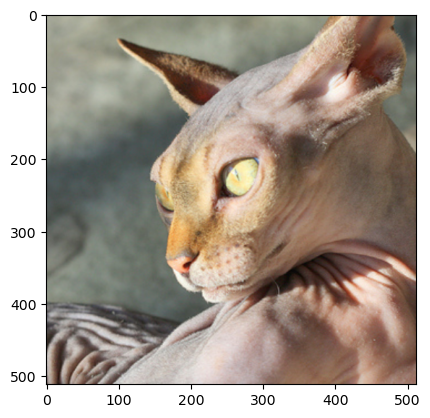

In [256]:
x_pil = fastai.vision.core.PILImage.create('/root/.fastai/data/oxford-iiit-pet/images/Sphynx_14.jpg')
x = next(iter(dls.test_dl([x_pil])))[0]
x_dec = dls.decode([x])[0]
plt.imshow(torch.einsum('ocij -> ijc', x_dec))

`-` 하나의 observation이 yhat까지 나오는 과정

In [299]:
# 계산방식1: 원래계산방식
ap = lrnr2.model[-1][0]
fl = lrnr2.model[-1][1]
l = lrnr2.model[-1][2]
print(f"{x.shape} -- x")
print(f"{net1(x).shape} -- net1(x)")
print(f"{ap(net1(x)).shape} -- ap(net1(x))")
print(f"{fl(ap(net1(x))).shape} -- flatten(ap(net1(x)))")
print(f"{l(fl(ap(net1(x)))).shape} -- l(flatten(ap(net1(x))))")
l(fl(ap(net1(x))))

torch.Size([1, 3, 512, 512]) -- x
torch.Size([1, 512, 16, 16]) -- net1(x)
torch.Size([1, 512, 1, 1]) -- ap(net1(x))
torch.Size([1, 512]) -- flatten(ap(net1(x)))
torch.Size([1, 2]) -- l(flatten(ap(net1(x))))


TensorImage([[ 2.7846, -2.7945]], device='cuda:0', grad_fn=<AliasBackward0>)

**net2의 순서 바꾸기 전 전체 네트워크**
$$\underset{(1,3,512,512)}{\boldsymbol x} \overset{net_1}{\to} \left( \underset{(1,512,16,16)}{\tilde{\boldsymbol x}} \overset{ap}{\to} \underset{(1,512,1,1)}{{\boldsymbol \sharp}}\overset{flatten}{\to} \underset{(1,512)}{{\boldsymbol \sharp}}\overset{linear}{\to} \underset{(1,2)}{\hat{\boldsymbol y}}\right) = [[2.7846, -2.7945]]$$

In [321]:
# 계산방식2: net2의 순서를 바꾼 계산
ap = lrnr2.model[-1][0]
fl = lrnr2.model[-1][1]
l = lrnr2.model[-1][2]
WHY = torch.einsum('ocij,kc -> okij', net1(x), l.weight.data)
print(f"{x.shape} -- x")
print(f"{net1(x).shape} -- net1(x)")
print(f"{WHY.shape} -- l(net1(x)):=WHY")
print(f"{ap(WHY).shape} -- ap(l(net1(x)))=ap(WHY)")
print(f"{fl(ap(WHY)).shape} -- flatten(ap(l(net1(x)))))=flatten(ap(WHY))")
fl(ap(torch.einsum('ocij,kc -> okij', net1(x), l.weight.data)))

torch.Size([1, 3, 512, 512]) -- x
torch.Size([1, 512, 16, 16]) -- net1(x)
torch.Size([1, 2, 16, 16]) -- l(net1(x)):=WHY
torch.Size([1, 2, 1, 1]) -- ap(l(net1(x)))=ap(WHY)
torch.Size([1, 2]) -- flatten(ap(l(net1(x)))))=flatten(ap(WHY))


TensorImage([[ 2.7846, -2.7945]], device='cuda:0', grad_fn=<AliasBackward0>)

**net2의 순서를 바꾼후 전체 네트워크**
$$\underset{(1,3,224,224)}{\boldsymbol x} \overset{net_1}{\to} \left( \underset{(1,512,16,16)}{\tilde{\boldsymbol x}} \overset{linear}{\to} \underset{(1,2,16,16)}{{\bf WHY}}\overset{ap}{\to} \underset{(1,2,1,1)}{{\boldsymbol \sharp}}\overset{flatten}{\to} \underset{(1,2)}{\hat{\boldsymbol y}}\right) = [[2.7846,-2.7945]]$$

- 참고: 여기에서 linear는 (1,512,16,16)의 each pixel에 `torch.nn.Linear(512,2)`를 수행함.

### $\star$ 잠깐 멈추고 생각 좀 해보자..

`-` 입력이미지 

In [323]:
x_pil, x

(PILImage mode=RGB size=500x333,
 TensorImage([[[[ 0.8104,  0.7933,  0.7762,  ..., -0.6794, -0.6794, -0.6794],
                [ 0.8104,  0.7933,  0.7762,  ..., -0.6965, -0.6965, -0.6965],
                [ 0.8104,  0.7933,  0.7762,  ..., -0.7137, -0.7137, -0.7137],
                ...,
                [-0.6623, -0.2171,  0.3138,  ...,  0.5707,  0.5364,  0.5022],
                [-0.7650, -0.3541,  0.1597,  ...,  0.5707,  0.5193,  0.4851],
                [-0.8335, -0.4568,  0.0398,  ...,  0.5707,  0.5193,  0.4679]],
 
               [[ 0.9930,  0.9755,  0.9580,  ..., -0.5301, -0.5126, -0.4951],
                [ 0.9930,  0.9755,  0.9580,  ..., -0.5301, -0.5126, -0.4951],
                [ 1.0105,  0.9930,  0.9580,  ..., -0.5126, -0.4951, -0.4951],
                ...,
                [-1.0553, -0.5301,  0.1527,  ..., -0.0399,  0.0126,  0.0476],
                [-1.1604, -0.6527,  0.0301,  ...,  0.0301,  0.0651,  0.0651],
                [-1.2479, -0.7402, -0.0574,  ...,  0.0826,  0.08

`-` 원래 net2를 그대로 적용한 결과를 해석 

In [325]:
net2(net1(x))

TensorImage([[ 2.7846, -2.7945]], device='cuda:0', grad_fn=<AliasBackward0>)

- "2.7846 > -2.7945" 이므로, `ximg`는 높은 확률로 고양이라는 것을 의미함. 

`-` 바뀐 net2를 적용해볼까? 

In [328]:
flatten(ap(WHY))

TensorImage([[ 2.7846, -2.7945]], device='cuda:0', grad_fn=<AliasBackward0>)

In [336]:
WHY[0,0,:,:].mean() # 이 값이 클수록 고양이

TensorImage(2.7846, device='cuda:0', grad_fn=<AliasBackward0>)

In [337]:
WHY[0,1,:,:].mean() # 이 값이 클수록 강아지 

TensorImage(-2.7945, device='cuda:0', grad_fn=<AliasBackward0>)

`-` 좀더 파고들어서 분석해보자. 

In [339]:
WHY[0,0,:,:].int() # 이 값들의 평균이 2.7846임. 그리고 이 평균값이 클수록 고양이

TensorImage([[ 0,  0,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
             [ 0,  0,  2,  5,  2,  1,  1,  0,  0,  0,  0,  0,  0,  0, -1, -1],
             [ 0,  0,  1,  3,  2,  0,  0,  0,  0,  0,  0,  0,  0, -1, -1, -3],
             [ 0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
             [ 0,  0,  0,  0, -1, -3, -2,  0,  0,  0,  0,  0,  0,  0,  0,  0],
             [ 0,  0,  0,  0,  0, -3, -1,  1,  2,  1,  0,  0, -1,  0,  0,  1],
             [ 0,  0,  0,  0,  0, -1,  1, 11, 19, 14,  4,  0, -1, -1,  0,  0],
             [ 0,  0,  0,  0,  0, -1,  6, 24, 40, 28,  9,  0,  0,  0,  0,  0],
             [ 0,  0,  0,  0,  0,  1, 11, 31, 46, 33, 11,  1,  0,  0,  0,  0],
             [ 0,  0,  0,  0,  1,  7, 16, 27, 32, 23,  9,  1,  0,  1,  1,  1],
             [-1,  0,  0,  0,  4, 14, 22, 20, 17, 11,  5,  2,  2,  3,  4,  3],
             [-1,  0,  0,  1,  6, 16, 23, 12,  4,  2,  3,  3,  3,  3,  4,  4],
             [ 0,  0,  1,  1,  5, 11, 13,  7,  2,  1

- 이 값들의 평균은 2.7846임. 
- 이 값들이 클수록 이 그림은 고양이라는 의미임 = 이 값이 작을수록 이 그림은 고양이 그림이 아니라는 의미임. 
- 그런데 살펴보니 대부분의 위치에서 0에 가까운 값을 가지고, 특정 위치에서만 엄청 큰 값이 있어서 2.7846이라는 값이 나온 것임. 
- 특정위치에 존재하는 엄청 큰 값들은, `x`가 고양이 이미지라고 판단하는 근거가 된다. 

In [341]:
WHY[0,1,:,:].int() # 이 값들의 평균이 2.7846임. 그리고 이 평균값이 클수록 고양이

TensorImage([[  0,   0,  -1,  -1,  -1,   0,   0,   0,   0,   0,   0,   0,   0,
                0,   0,   0],
             [  0,   0,  -2,  -6,  -2,  -1,  -1,  -1,   0,   0,   0,   0,   0,
                0,   1,   0],
             [  0,   0,  -1,  -2,  -2,  -1,   0,   0,   0,   0,   0,  -1,   0,
                0,   1,   2],
             [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
                0,   0,   0],
             [  0,   0,   0,   0,   1,   2,   1,   0,   0,   0,   0,   0,   0,
                0,   0,   0],
             [  0,   0,   0,   0,   0,   2,   0,  -1,  -2,  -2,   0,   0,   0,
                0,   0,  -2],
             [  0,   0,   0,   0,   0,   0,  -1, -11, -18, -15,  -5,   0,   0,
                1,   0,   0],
             [  0,   0,   0,   0,   0,   0,  -6, -22, -34, -26,  -9,   0,   0,
                0,   0,   0],
             [  0,   0,   0,   0,   0,  -1, -10, -28, -41, -30, -11,  -1,   0,
                0,   0,   0],
             [  0, 

- 특정위치에 존재하는 작은 값들은, 이 그림이 고양이가 아니라고 판단하는 근거가 된다. 

$$\underset{(1,2,16,16)}{{\bf WHY}}\overset{ap}{\to} \underset{(1,2,1,1)}{{\boldsymbol \sharp}}\overset{flatten}{\to} \underset{(1,2)}{\hat{\boldsymbol y}} = [[2.7846,-2.7945]]$$

`-` 시각화1 

In [344]:
WHYCAT = WHY[0,0,:,:].to("cpu").detach()
WHYDOG = WHY[0,1,:,:].to("cpu").detach()

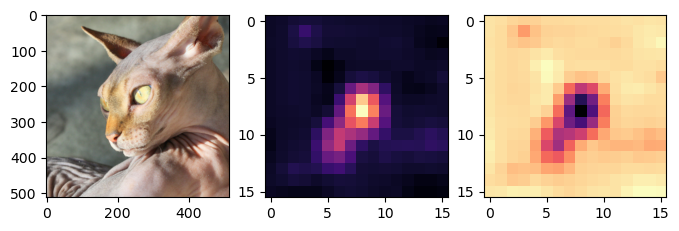

In [358]:
fig,ax = plt.subplots(1,3,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',x_dec))
ax[1].imshow(WHYCAT,cmap='magma')
ax[2].imshow(WHYDOG,cmap='magma')

- magma: 검은색 < 보라색 < 빨간색 < 노란색 
- 가운데 그림의 노란부분은 고양이라는 증거, 오른쪽 그림의 검보라색 부분은 고양이가 아니라는 증거

`-` 시각화2

In [360]:
WHYCAT.shape

torch.Size([16, 16])

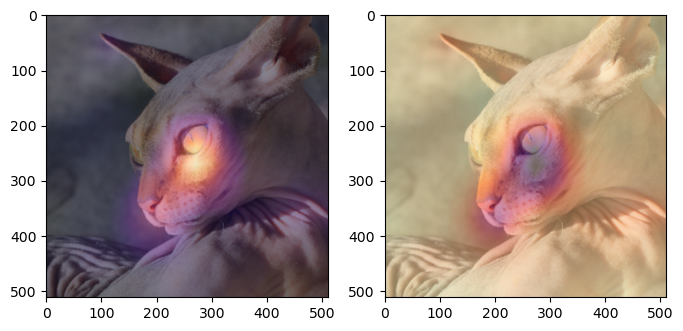

In [370]:
fig,ax = plt.subplots(1,2,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',x_dec))
ax[0].imshow(WHYCAT,cmap='magma',extent = (0,511,511,0), interpolation='bilinear',alpha=0.5)
ax[1].imshow(torch.einsum('ocij -> ijc',x_dec))
ax[1].imshow(WHYDOG,cmap='magma',extent = (0,511,511,0), interpolation='bilinear',alpha=0.5)

`-` 하니를 활용한 시각화 

In [402]:
x_pil = fastai.vision.core.PILImage.create(requests.get('https://github.com/guebin/DL2024/blob/main/imgs/01wk-hani1.jpeg?raw=true').content)
x = next(iter(dls.test_dl([x_pil])))[0] # lrnr를 학습이후에는 여기에 저장되는 x값이 조금 달라지게됨
x_dec = dls.decode([x])
WHY = torch.einsum('ocij,kc -> okij', net1(x), l.weight.data)
WHYCAT = WHY[0,0,:,:].to("cpu").detach()
WHYDOG = WHY[0,1,:,:].to("cpu").detach()
softmax = torch.nn.Softmax(dim=1)
cat_prob, dog_prob = softmax(flatten(ap(WHY))).to("cpu").detach().tolist()[0]

Text(0.5, 1.0, 'dog prob = 0.999991')

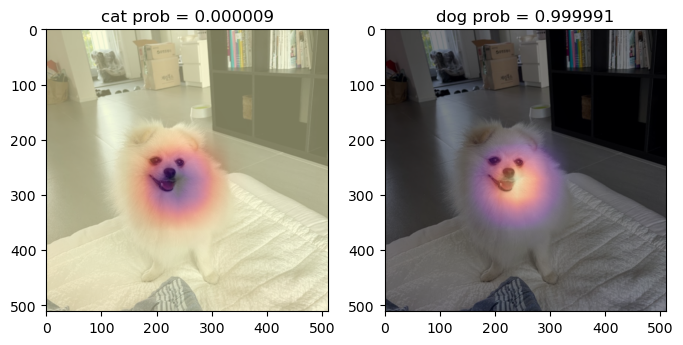

In [403]:
fig,ax = plt.subplots(1,2,figsize=(8,4))
ax[0].imshow(torch.einsum('ocij -> ijc',x_dec))
ax[0].imshow(WHYCAT,cmap='magma',extent = (0,511,511,0), interpolation='bilinear',alpha=0.5)
ax[0].set_title(f"cat prob = {cat_prob:.6f}")
ax[1].imshow(torch.einsum('ocij -> ijc',x_dec))
ax[1].imshow(WHYDOG,cmap='magma',extent = (0,511,511,0), interpolation='bilinear',alpha=0.5)
ax[1].set_title(f"dog prob = {dog_prob:.6f}")

## D. 4단계 -- CAM 시각화 

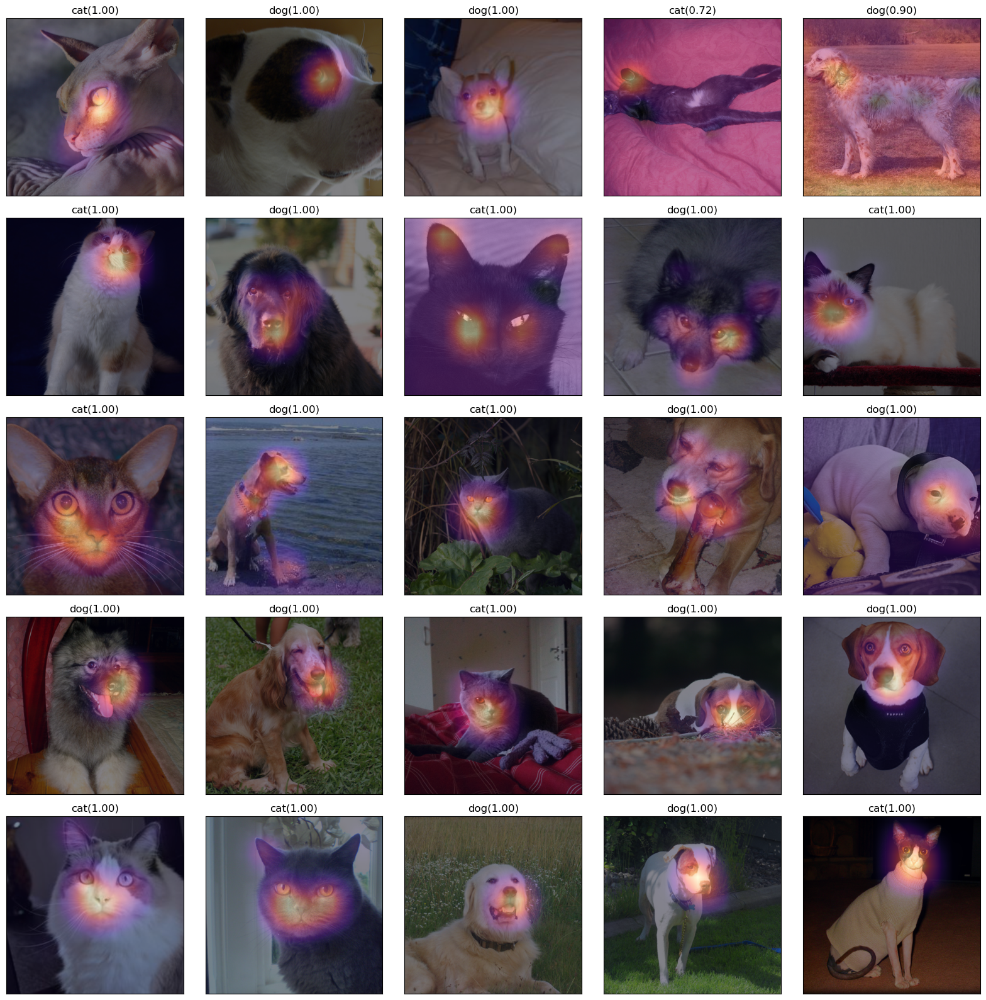

In [456]:
fig,ax = plt.subplots(5,5)
#---#
k=0
for i in range(5):
    for j in range(5):
        x_pil = fastai.vision.core.PILImage.create(fastai.data.transforms.get_image_files(path/'images')[k])
        x = next(iter(dls.test_dl([x_pil])))[0] # 이걸로 WHY를 만들어보자. 
        x_dec = dls.decode([x])[0] # 이걸로 시각화 
        WHY = torch.einsum('ocij,kc -> okij',net1(x),l.weight.data)
        WHYCAT = WHY[0,0,:,:].to("cpu").detach()
        WHYDOG = WHY[0,1,:,:].to("cpu").detach()
        cat_prob, dog_prob = softmax(flatten(ap(WHY))).to("cpu").detach().tolist()[0]
        if cat_prob > dog_prob: 
            ax[i][j].imshow(torch.einsum('ocij -> ijc',x_dec))
            ax[i][j].imshow(WHYCAT,cmap='magma',extent = (0,511,511,0), interpolation='bilinear',alpha=0.5)
            ax[i][j].set_title(f"cat({cat_prob:.2f})")
            ax[i][j].set_xticks([])
            ax[i][j].set_yticks([])            
        else: 
            ax[i][j].imshow(torch.einsum('ocij -> ijc',x_dec))
            ax[i][j].imshow(WHYDOG,cmap='magma',extent = (0,511,511,0), interpolation='bilinear',alpha=0.5)
            ax[i][j].set_title(f"dog({dog_prob:.2f})")
            ax[i][j].set_xticks([])
            ax[i][j].set_yticks([])            
        k=k+1
fig.set_figheight(16)
fig.set_figwidth(16)
fig.tight_layout()

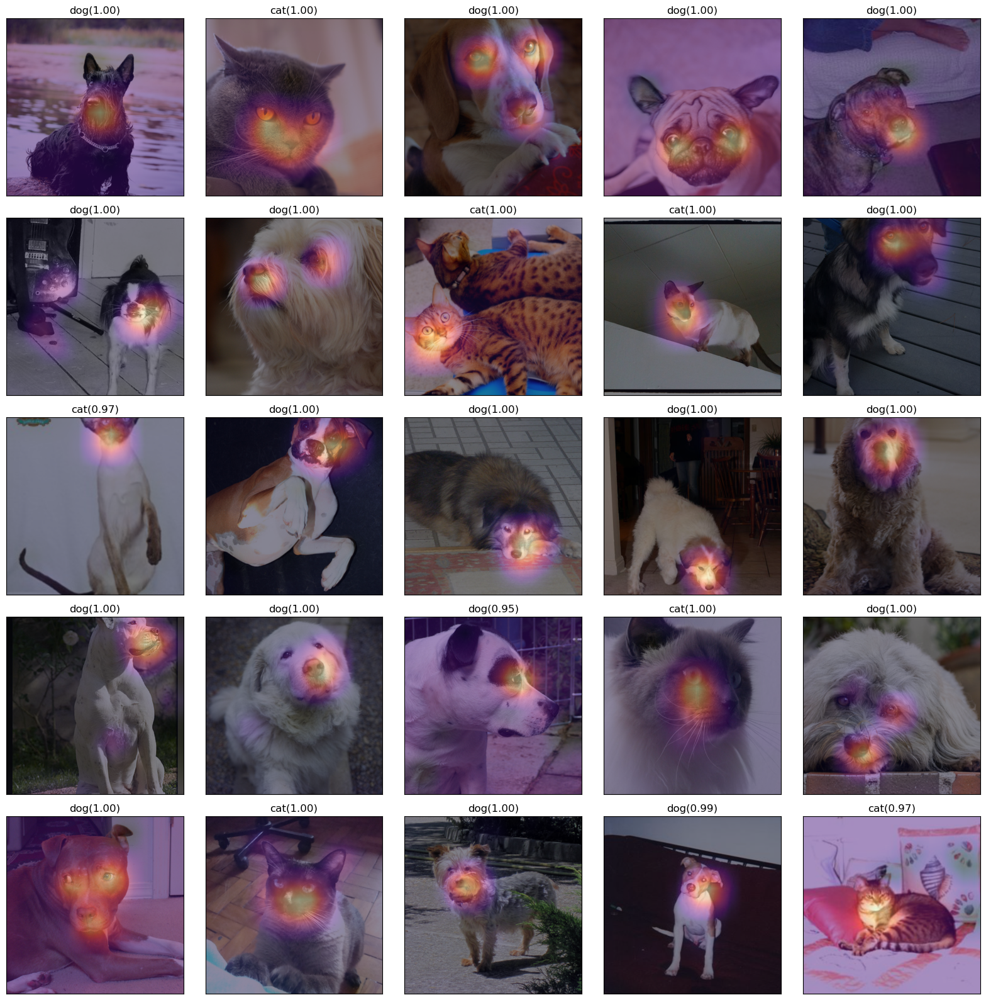

In [457]:
fig,ax = plt.subplots(5,5)
#---#
k=25
for i in range(5):
    for j in range(5):
        x_pil = fastai.vision.core.PILImage.create(fastai.data.transforms.get_image_files(path/'images')[k])
        x = next(iter(dls.test_dl([x_pil])))[0] # 이걸로 WHY를 만들어보자. 
        x_dec = dls.decode([x])[0] # 이걸로 시각화 
        WHY = torch.einsum('ocij,kc -> okij',net1(x),l.weight.data)
        WHYCAT = WHY[0,0,:,:].to("cpu").detach()
        WHYDOG = WHY[0,1,:,:].to("cpu").detach()
        cat_prob, dog_prob = softmax(flatten(ap(WHY))).to("cpu").detach().tolist()[0]
        if cat_prob > dog_prob: 
            ax[i][j].imshow(torch.einsum('ocij -> ijc',x_dec))
            ax[i][j].imshow(WHYCAT,cmap='magma',extent = (0,511,511,0), interpolation='bilinear',alpha=0.5)
            ax[i][j].set_title(f"cat({cat_prob:.2f})")
            ax[i][j].set_xticks([])
            ax[i][j].set_yticks([])
        else: 
            ax[i][j].imshow(torch.einsum('ocij -> ijc',x_dec))
            ax[i][j].imshow(WHYDOG,cmap='magma',extent = (0,511,511,0), interpolation='bilinear',alpha=0.5)
            ax[i][j].set_title(f"dog({dog_prob:.2f})")
            ax[i][j].set_xticks([])
            ax[i][j].set_yticks([])            
        k=k+1
fig.set_figheight(16)
fig.set_figwidth(16)
fig.tight_layout() 

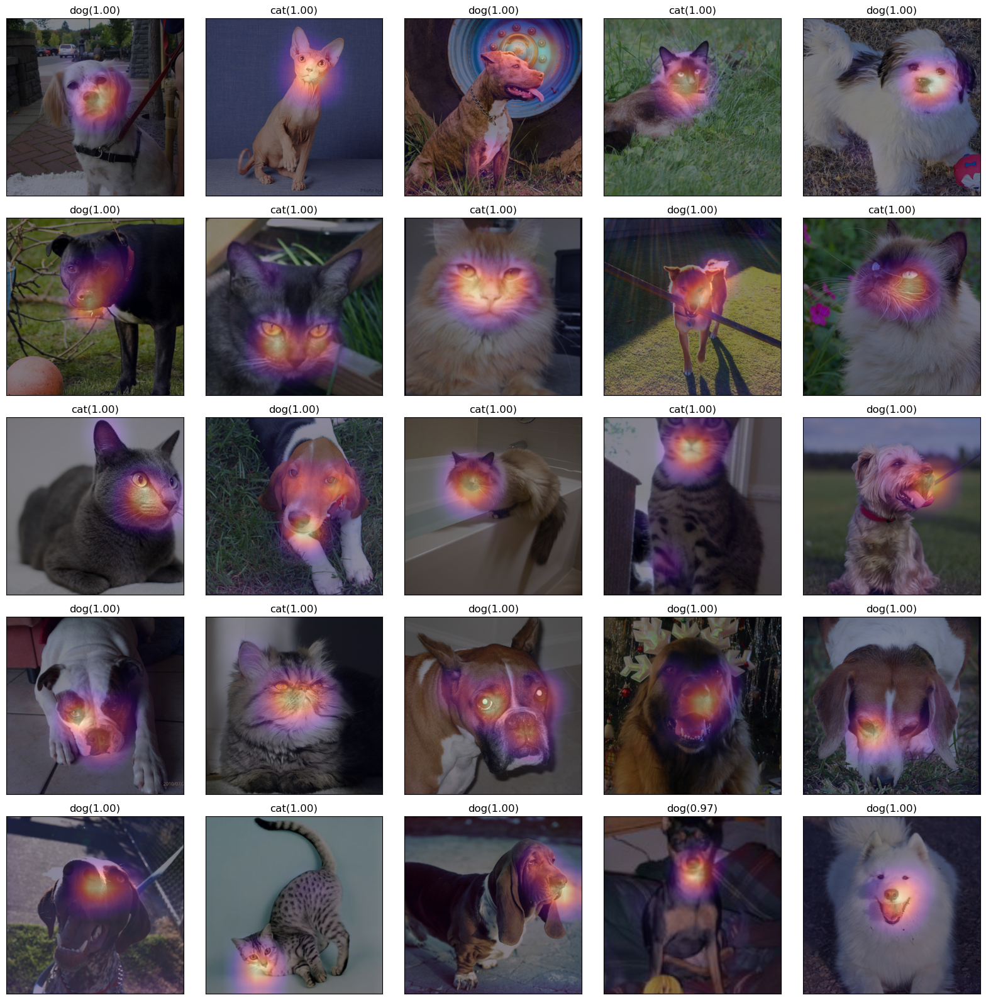

In [458]:
fig,ax = plt.subplots(5,5)
#---#
k=50
for i in range(5):
    for j in range(5):
        x_pil = fastai.vision.core.PILImage.create(fastai.data.transforms.get_image_files(path/'images')[k])
        x = next(iter(dls.test_dl([x_pil])))[0] # 이걸로 WHY를 만들어보자. 
        x_dec = dls.decode([x])[0] # 이걸로 시각화 
        WHY = torch.einsum('ocij,kc -> okij',net1(x),l.weight.data)
        WHYCAT = WHY[0,0,:,:].to("cpu").detach()
        WHYDOG = WHY[0,1,:,:].to("cpu").detach()
        cat_prob, dog_prob = softmax(flatten(ap(WHY))).to("cpu").detach().tolist()[0]
        if cat_prob > dog_prob: 
            ax[i][j].imshow(torch.einsum('ocij -> ijc',x_dec))
            ax[i][j].imshow(WHYCAT,cmap='magma',extent = (0,511,511,0), interpolation='bilinear',alpha=0.5)
            ax[i][j].set_title(f"cat({cat_prob:.2f})")
            ax[i][j].set_xticks([])
            ax[i][j].set_yticks([])            
        else: 
            ax[i][j].imshow(torch.einsum('ocij -> ijc',x_dec))
            ax[i][j].imshow(WHYDOG,cmap='magma',extent = (0,511,511,0), interpolation='bilinear',alpha=0.5)
            ax[i][j].set_title(f"dog({dog_prob:.2f})")
            ax[i][j].set_xticks([])
            ax[i][j].set_yticks([])            
        k=k+1
fig.set_figheight(16)
fig.set_figwidth(16)
fig.tight_layout()

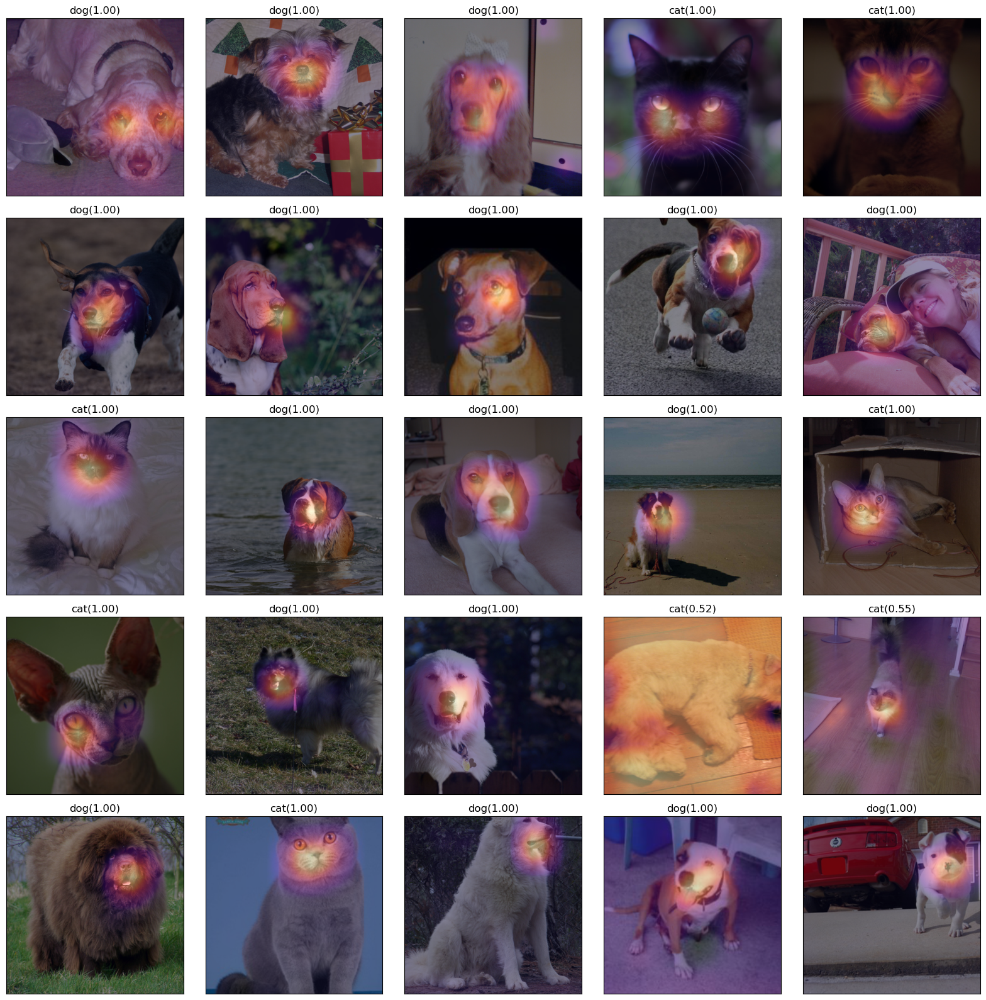

In [459]:
fig,ax = plt.subplots(5,5)
#---#
k=75
for i in range(5):
    for j in range(5):
        x_pil = fastai.vision.core.PILImage.create(fastai.data.transforms.get_image_files(path/'images')[k])
        x = next(iter(dls.test_dl([x_pil])))[0] # 이걸로 WHY를 만들어보자. 
        x_dec = dls.decode([x])[0] # 이걸로 시각화 
        WHY = torch.einsum('ocij,kc -> okij',net1(x),l.weight.data)
        WHYCAT = WHY[0,0,:,:].to("cpu").detach()
        WHYDOG = WHY[0,1,:,:].to("cpu").detach()
        cat_prob, dog_prob = softmax(flatten(ap(WHY))).to("cpu").detach().tolist()[0]
        if cat_prob > dog_prob: 
            ax[i][j].imshow(torch.einsum('ocij -> ijc',x_dec))
            ax[i][j].imshow(WHYCAT,cmap='magma',extent = (0,511,511,0), interpolation='bilinear',alpha=0.5)
            ax[i][j].set_title(f"cat({cat_prob:.2f})")
            ax[i][j].set_xticks([])
            ax[i][j].set_yticks([])            
        else: 
            ax[i][j].imshow(torch.einsum('ocij -> ijc',x_dec))
            ax[i][j].imshow(WHYDOG,cmap='magma',extent = (0,511,511,0), interpolation='bilinear',alpha=0.5)
            ax[i][j].set_title(f"dog({dog_prob:.2f})")
            ax[i][j].set_xticks([])
            ax[i][j].set_yticks([])            
        k=k+1
fig.set_figheight(16)
fig.set_figwidth(16)
fig.tight_layout()